In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [97]:
import os

In [98]:
files = os.listdir('./data')
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-sep14.csv',
 'uber-raw-data-aug14.csv']

In [99]:
# Reading and concat data
PATH_DATA = './data/'
concat_df = pd.DataFrame()
for file in files:
    df = pd.read_csv(PATH_DATA + file,  encoding = 'UTF-8')
    concat_df = pd.concat([concat_df, df])

In [100]:
concat_df

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
...,...,...,...,...
829270,8/31/2014 23:55:00,40.7552,-73.9753,B02764
829271,8/31/2014 23:55:00,40.7552,-73.9753,B02764
829272,8/31/2014 23:55:00,40.7617,-73.9788,B02764
829273,8/31/2014 23:59:00,40.7395,-73.9889,B02764


In [101]:
df = concat_df.copy()

In [102]:
df

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512
...,...,...,...,...
829270,8/31/2014 23:55:00,40.7552,-73.9753,B02764
829271,8/31/2014 23:55:00,40.7552,-73.9753,B02764
829272,8/31/2014 23:55:00,40.7617,-73.9788,B02764
829273,8/31/2014 23:59:00,40.7395,-73.9889,B02764


In [103]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [104]:
# Transform Date/Time column from string to datetime format
df['Date/Time'] = pd.to_datetime(df['Date/Time'], format="%m/%d/%Y %H:%M:%S")
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [105]:
# Create day, month, hour, minute columns
df['weekday'] = df['Date/Time'].dt.day_name()
df['day'] = df['Date/Time'].dt.day
df['month'] = df['Date/Time'].dt.month
df['hour'] = df['Date/Time'].dt.hour
df['minute'] = df['Date/Time'].dt.minute

df.head()

,Date/Time,Lat,Lon,Base,weekday,day,month,hour,minute
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,4,0,11
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,4,0,17
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,4,0,21
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,4,0,28
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,4,0,33


In [106]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
weekday              object
day                   int64
month                 int64
hour                  int64
minute                int64
dtype: object

In [107]:
df['weekday'].value_counts()

Thursday     755145
Friday       741139
Wednesday    696488
Tuesday      663789
Saturday     646114
Monday       541472
Sunday       490180
Name: weekday, dtype: int64

In [108]:
px.bar(x = df['weekday'].value_counts().index,
       y= df['weekday'].value_counts(),
       width = 800, height = 400,
       labels = dict(x = "Weekdays", y = "Trips")
)

Obs: Can see that trips are increasing reaching weekend

In [109]:
df['hour'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

(array([103836.,  67227.,  45865.,  48287.,  55230.,  83939., 143213.,
        193094., 190504., 159967., 159148., 165703., 170452., 195877.,
        230625., 275466., 313400., 336190., 324679., 294513., 284604.,
        281460., 241858., 169190.]),
 array([-0.5,  0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5,
        10.5, 11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5,
        21.5, 22.5, 23.5]),
 <BarContainer object of 24 artists>)

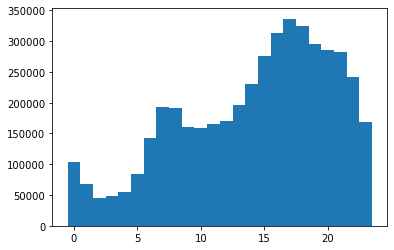

In [110]:
plt.hist(df['hour'],
         bins = 24,
         range = (-0.5, 23.5))

In [111]:
MONTHS = {1: 'JANUARY', 2: 'FEBRUARY', 3: 'MARCH', 4: 'APRIL', 5: 'MAY', 6: 'JUNE', 7: 'JULY', 8: 'AUGUST', 9: 'SEPTEMBER', 10: 'OCTOBER', 11: 'NOVEMBER', 12: 'DECEMBER'}

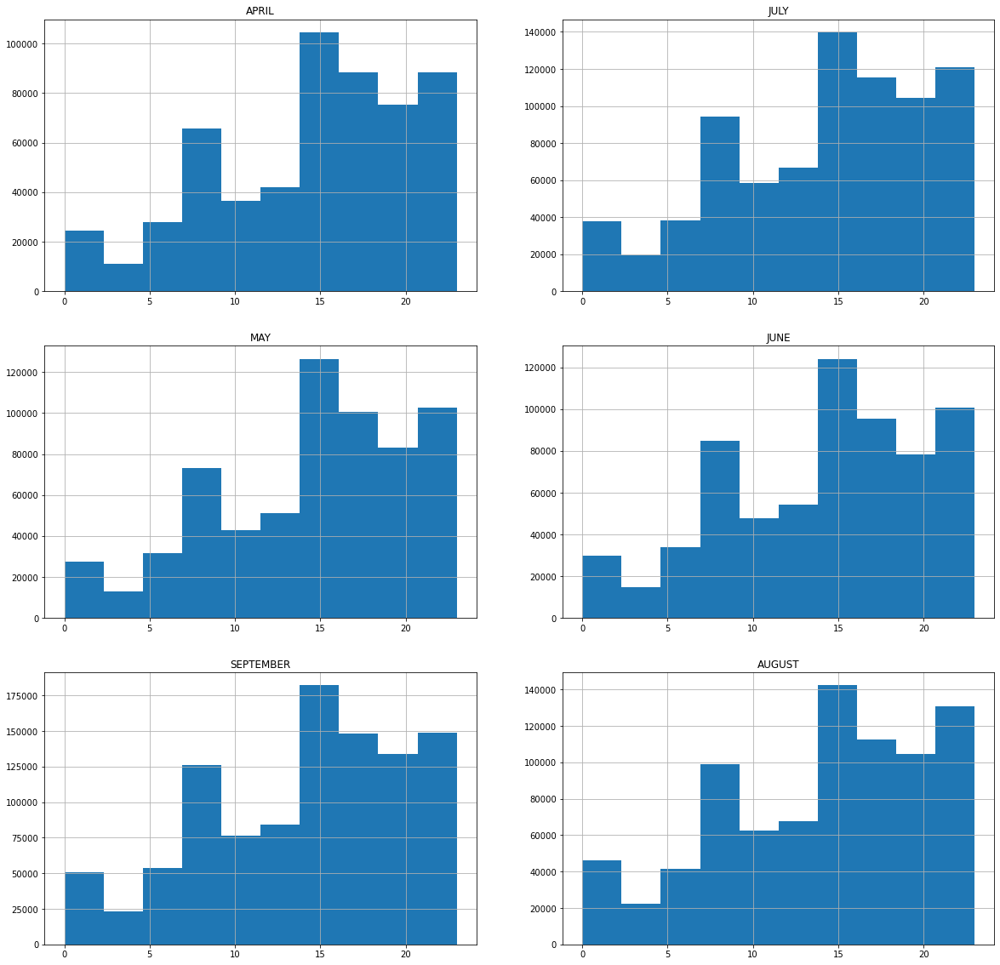

In [112]:
plt.figure(figsize = (20,20))

for index, month in enumerate(df['month'].unique()):
    plt.subplot(3,2,index + 1).set_title(MONTHS[month])
    df[df['month'] == month]['hour'].hist()
plt.show()

Obs: There is a trent to increase trips at the final of each month, reaching top on 15th.

In [113]:
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [114]:
df.groupby('month')['hour'].count()

month
4     564516
5     652435
6     663844
7     796121
8     829275
9    1028136
Name: hour, dtype: int64

In [138]:
# Trips per month
trace1 = go.Bar(
    x = df.groupby('month')['hour'].count().index,
    y = df.groupby('month')['hour'].count(),
    name = 'Priority',
)
iplot([trace1])

Obs: On September increased trips, the reason could be find on events information of the city.

Text(0.5, 1.0, 'Journeys by month day')

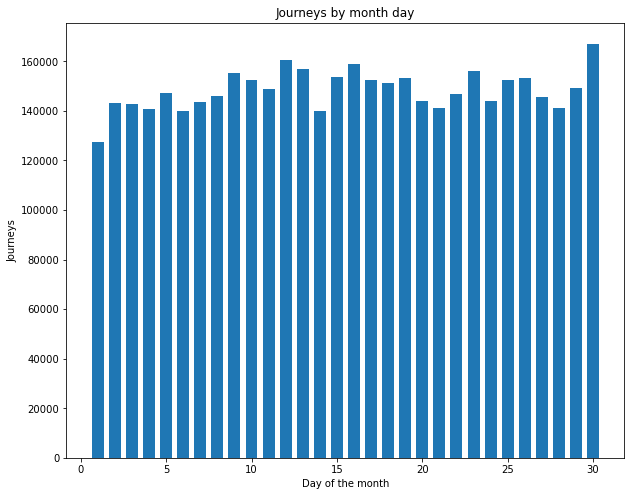

In [139]:
plt.figure(figsize = (10,8))
plt.hist(df['day'], bins = 30, rwidth = 0.7, range = (0.5,30.5))
plt.xlabel('Day of the month')
plt.ylabel('Journeys')
plt.title('Journeys by month day')

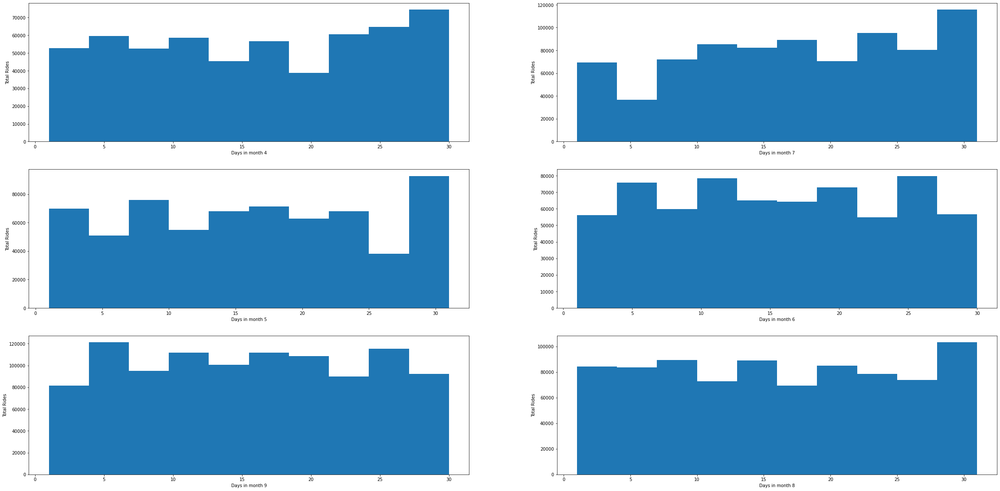

In [117]:
plt.figure(figsize=(40,20))
for index, month in enumerate(df['month'].unique(),1):
    plt.subplot(3,2,index)
    df_out = df[df['month'] == month]
    plt.hist(df_out['day'])
    plt.xlabel(f'Days in month {month}')
    plt.ylabel('Total Rides')
    

Text(0.5, 1.0, 'Hour rides vs Passengers Latitudes')

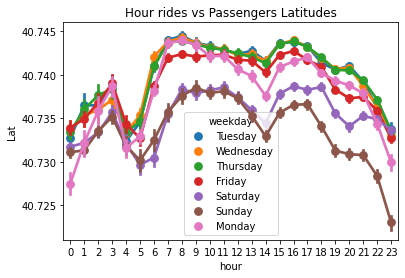

In [118]:
ax = sns.pointplot(data = df, x = 'hour', y = 'Lat', hue='weekday')
ax.set_title('Hour rides vs Passengers Latitudes')

Obs: This plot use to get trip trends depend of the streets on New York

In [119]:
base = df.groupby(['Base','month'])['Date/Time'].count().reset_index()
base.head()

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472


<AxesSubplot:xlabel='month', ylabel='Date/Time'>

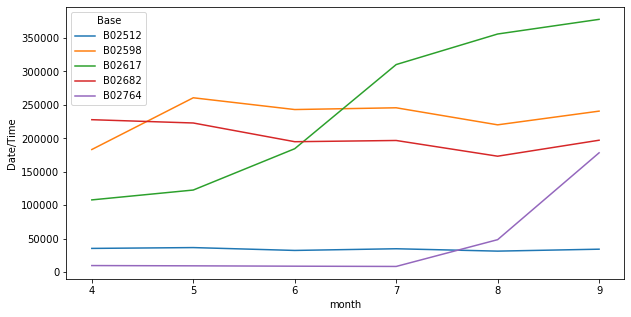

In [120]:
plt.figure(figsize=(10,5))
sns.lineplot(data = base,
             x = 'month',
             y = 'Date/Time',
             hue = 'Base')

In [121]:
df.groupby(['weekday','hour']).count()

Date/Time    Lat    Lon   Base    day  month  minute
weekday   hour                                                      
Friday    0         13716  13716  13716  13716  13716  13716   13716
          1          8163   8163   8163   8163   8163   8163    8163
          2          5350   5350   5350   5350   5350   5350    5350
          3          6930   6930   6930   6930   6930   6930    6930
          4          8806   8806   8806   8806   8806   8806    8806
...                   ...    ...    ...    ...    ...    ...     ...
Wednesday 19        47017  47017  47017  47017  47017  47017   47017
          20        47772  47772  47772  47772  47772  47772   47772
          21        44553  44553  44553  44553  44553  44553   44553
          22        32868  32868  32868  32868  32868  32868   32868
          23        18146  18146  18146  18146  18146  18146   18146

[168 rows x 7 columns]

In [122]:
def count_rows(rows):
    return len(rows)

by_cross = df.groupby(['weekday','hour']).apply(count_rows)
by_cross

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Length: 168, dtype: int64

In [123]:
pivot = by_cross.unstack()
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


<AxesSubplot:xlabel='hour', ylabel='weekday'>

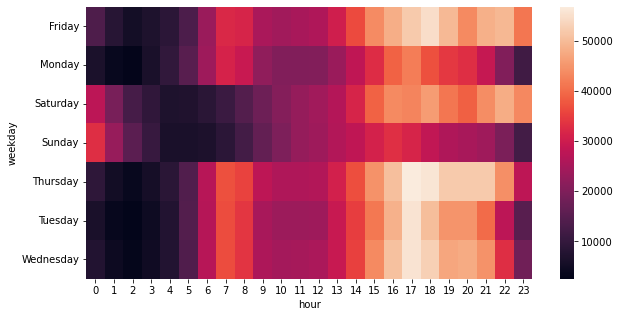

In [124]:
plt.figure(figsize=(10,5))
sns.heatmap(pivot)

In [125]:
def heatmap(col1,col2):
    by_cross = df.groupby([col1,col2]).apply(count_rows)
    pivot = by_cross.unstack()
    plt.figure(figsize=(10,5))
    return sns.heatmap(pivot)

<AxesSubplot:xlabel='hour', ylabel='day'>

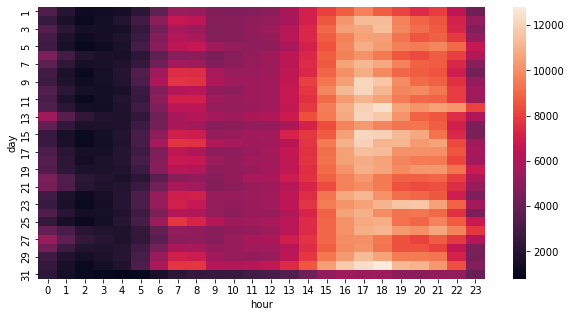

In [126]:
heatmap('day','hour')

(40.6, 41.0)

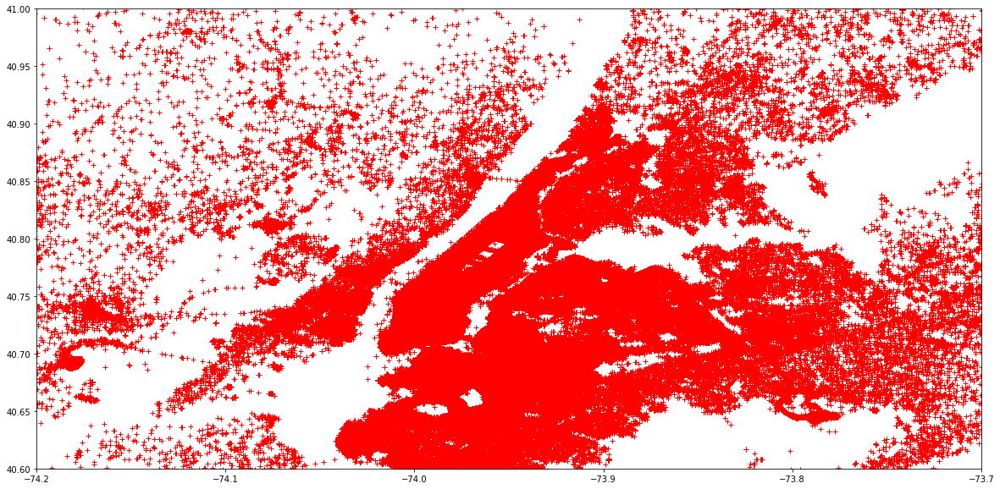

In [127]:
plt.figure(figsize=(20,10))
plt.plot(df['Lon'], df['Lat'],'r+')
plt.xlim(-74.2, -73.7)
plt.ylim(40.6, 41)

In [128]:
df_out = df[df['weekday'] == 'Sunday']

In [129]:
df_out.shape

(490180, 9)

In [130]:
df_out.head()

,Date/Time,Lat,Lon,Base,weekday,day,month,hour,minute
6965,2014-04-06 00:00:00,40.6547,-74.3033,B02512,Sunday,6,4,0,0
6966,2014-04-06 00:00:00,40.7356,-74.0006,B02512,Sunday,6,4,0,0
6967,2014-04-06 00:00:00,40.7421,-74.0041,B02512,Sunday,6,4,0,0
6968,2014-04-06 00:00:00,40.7401,-74.0053,B02512,Sunday,6,4,0,0
6969,2014-04-06 00:01:00,40.7368,-73.9877,B02512,Sunday,6,4,0,1


In [131]:
rush = df_out.groupby(['Lat','Lon'])['weekday'].count().reset_index()
rush.columns = ['Lat','Lon','Nº of trips']
rush

,Lat,Lon,Nº of trips
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [132]:
!pip install folium

In [133]:
from folium.plugins import HeatMap
import folium

In [134]:
baseMap = folium.Map()

In [135]:
HeatMap(rush, zoom=20, radius=15).add_to(baseMap)
baseMap

In [142]:
# Creating a function to create Heatmaps for each weekday
def heatmapPlot(df, day):
    baseMap = folium.Map()
    df_out = df[df['weekday'] == day]
    HeatMap(df_out.groupby(['Lat', 'Lon'])['weekday'].count().reset_index(), 
            zoom = 50,
            radius = 15).add_to(baseMap)
    return baseMap   

In [143]:
heatmapPlot(df,'Monday')

## Conclusion
Uber recollet all the information from their drivers and passengers, this data give us to much information about trends, passengers bahaviours that could be and its uses to give better service depend of the information deployed in this notebook ( Location, Dates and Hours ).
### Trends:
- More trips in afternoon until before midnight
- Increase movement from 15th until end of the month
- Near Manhattan use to be more Uber service 

### Recomendation:
- Impulse drivers to do Uber on rush hours and hot places while increasing advertisment or increment payment for drivers as improvement service for passengers.